<a href="https://colab.research.google.com/github/hanpi/EA_API_call/blob/main/fossil_multi_HS_v8_transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Code source <br>

Code adapted from Transfer Learning for Computer Vision Tutorial
https://pytorch.org/tutorials/beginner/transfer_learning_tutorial.html <br>
by Sasank Cholamkurthy <br>
Licence: BSD

In [ ]:
# Enables interactive use of matplotlib in IPython
%matplotlib inline

In [ ]:
# Mounts Google Drive to enable access to data stored there

from google.colab import drive
drive.mount('/content/drive')


Mounted at /content/drive


Transfer Learning for Computer Vision Tutorial
==============================================

**Author**: [Sasank Chilamkurthy](https://chsasank.github.io)

In this tutorial, you will learn how to train a convolutional neural
network for image classification using transfer learning. You can read
more about the transfer learning at [cs231n
notes](https://cs231n.github.io/transfer-learning/)

Quoting these notes,

> In practice, very few people train an entire Convolutional Network
> from scratch (with random initialization), because it is relatively
> rare to have a dataset of sufficient size. Instead, it is common to
> pretrain a ConvNet on a very large dataset (e.g. ImageNet, which
> contains 1.2 million images with 1000 categories), and then use the
> ConvNet either as an initialization or a fixed feature extractor for
> the task of interest.

These two major transfer learning scenarios look as follows:

-   **Finetuning the ConvNet**: Instead of random initialization, we
    initialize the network with a pretrained network, like the one that
    is trained on imagenet 1000 dataset. Rest of the training looks as
    usual.
-   **ConvNet as fixed feature extractor**: Here, we will freeze the
    weights for all of the network except that of the final fully
    connected layer. This last fully connected layer is replaced with a
    new one with random weights and only this layer is trained.


In [ ]:
# Import statements

import torch
import torch.nn as nn
import torch.optim as optim
from torch.optim import lr_scheduler
import torch.backends.cudnn as cudnn
import numpy as np
import torchvision
from torchvision import datasets, models, transforms
import matplotlib.pyplot as plt
import time
import os
from PIL import Image
from tempfile import TemporaryDirectory

cudnn.benchmark = True
plt.ion()   # interactive mode

In [ ]:
#Set device to GPU_indx if GPU is avaliable
GPU_indx = 0
device = torch.device(GPU_indx if torch.cuda.is_available() else 'cpu')

In [ ]:
# Set up parameters

# optimiser learning rate
lrate = 0.001

# Set number of iterations
num_epochs = 10

# size of mini-batches
b_size = 32

# resize images
image_size = 128

Load Data
=========

We will use torchvision and torch.utils.data packages for loading the
data.

The problem to solve in this project is to train a model to classify
**fossil images**. We have 160 training images each. There are 40 validation images for each class. This would be too small a dataset to train from scratch. Therefore we are applying transfer learning, so should be able to generalize
reasonably well.



In [ ]:
# Prepare a composition of transforms
# Data augmentation and normalization for training
# Just normalization for validation
data_transforms = {
    'train': transforms.Compose([
        transforms.RandomResizedCrop(image_size),
        transforms.RandomHorizontalFlip(p=0.5),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
    'val': transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(image_size),
        transforms.ToTensor(),
        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
    ]),
}

data_dir = '/content/drive/My Drive/Geo Fossils-I split1/'
image_datasets = {x: datasets.ImageFolder(os.path.join(data_dir, x),
                                          data_transforms[x])
                  for x in ['train', 'val']}
dataloaders = {x: torch.utils.data.DataLoader(image_datasets[x], batch_size=b_size,
                                             shuffle=True, num_workers=2)
              for x in ['train', 'val']}
dataset_sizes = {x: len(image_datasets[x]) for x in ['train', 'val']}
class_names = image_datasets['train'].classes

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

In [ ]:
# print sizes of datasets
print(dataset_sizes)


{'train': 973, 'val': 240}


Visualize a batch of images
======================

Let\'s visualize a batch of training images so as to understand the data
augmentations, and confirm images as a sense check.


The input data shape is (batch dimension, RGB channels, item width and height):
 torch.Size([32, 3, 128, 128])
The target output data shape is :
 torch.Size([32])


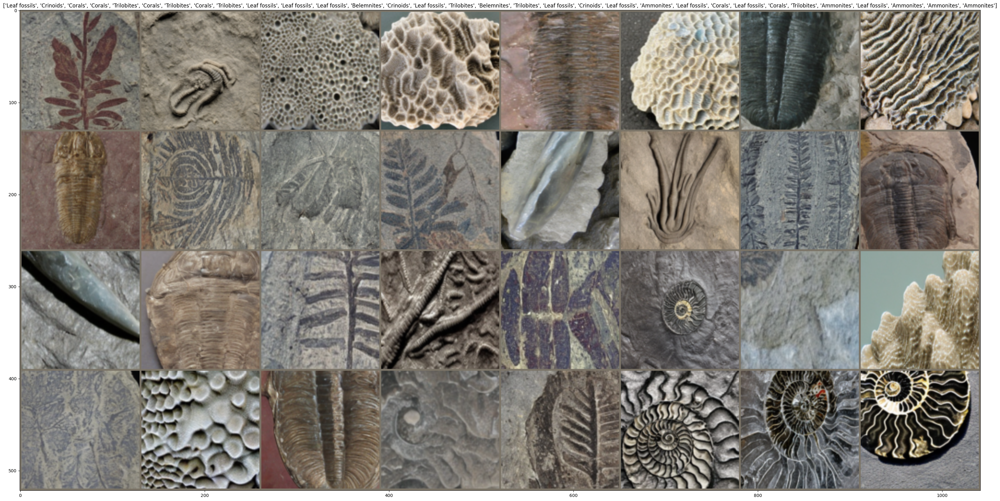

In [ ]:
def imshow(inp, title=None):
    """Display image for Tensor."""
    inp = inp.numpy().transpose((1, 2, 0))
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])
    inp = std * inp + mean
    inp = np.clip(inp, 0, 1)
    plt.imshow(inp)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated


# Get a batch of training data
inputs, classes = next(iter(dataloaders['train']))

# print shape of images and labels files (HS)
print("The input data shape is (batch dimension, RGB channels, item width and height):\n", inputs.shape)
print("The target output data shape is :\n", classes.shape)

# Make a grid from batch
plt.figure(figsize = (40,20))
out = torchvision.utils.make_grid(inputs)
imshow(out, title=[class_names[x] for x in classes])

In [ ]:
# print classes associated with images above
print(classes)

tensor([4, 3, 2, 2, 5, 2, 5, 2, 5, 4, 4, 4, 1, 3, 4, 5, 1, 5, 4, 3, 4, 0, 4, 2,
        4, 2, 5, 0, 4, 0, 0, 0])


Commentary (HS, based on Hisham code) <br>
As specified, mini-batch size is 32 <br>
There are 3 channels, for a colour image <br>
The image has been resized to 128 x 128 <br>

# Define the accuracy calculator
code from course notebook: Week6_ResNet18_STL10.ipynb
Hisham Jarward
Not applied as accuracy calcuation embedded in model training

In [ ]:
# added in v4
# Define accuracy calculator
# code from course notebook: Week6_ResNet18_STL10.ipynb Hisham Jarward
def calculate_accuracy(fx, y):
    preds = fx.max(1, keepdim=True)[1]
    correct = preds.eq(y.view_as(preds)).sum()
    acc = correct.float()/preds.shape[0]
    return acc

Training the model
==================

Now, let\'s write a general function to train a model. Here, we will:

-   Schedule the learning rate
-   Save the best model

Parameter `scheduler` is an LR scheduler object from
`torch.optim.lr_scheduler`.


In [ ]:
def train_model(model, criterion, optimizer, scheduler, num_epochs):
    since = time.time()

    # Create a temporary directory to save training checkpoints
    with TemporaryDirectory() as tempdir:
        best_model_params_path = os.path.join(tempdir, 'best_model_params.pt')

        torch.save(model.state_dict(), best_model_params_path)
        best_acc = 0.0

        for epoch in range(num_epochs):
            print(f'Epoch {epoch+1}/{num_epochs}')
            print('-' * 10)

            # Each epoch has a training and validation phase
            for phase in ['train', 'val']:
                if phase == 'train':
                    model.train()  # Set model to training mode
                else:
                    model.eval()   # Set model to evaluate mode

                running_loss = 0.0
                running_corrects = 0

                # Iterate over data.
                for inputs, labels in dataloaders[phase]:
                    inputs = inputs.to(device)
                    labels = labels.to(device)

                    # zero the parameter gradients
                    optimizer.zero_grad()

                    # forward
                    # track history if only in train
                    with torch.set_grad_enabled(phase == 'train'):
                        outputs = model(inputs)
                        _, preds = torch.max(outputs, 1)
                        loss = criterion(outputs, labels)



                        # backward + optimize only if in training phase
                        if phase == 'train':
                            loss.backward()
                            optimizer.step()

                    # statistics
                    running_loss += loss.item() * inputs.size(0)
                    running_corrects += torch.sum(preds == labels.data)

                    # v5 change loss logger records
                    if phase == 'train':
                      loss_logger_train.append(loss.item())
                    if phase == 'val':
                      loss_logger_val.append(loss.item())



                if phase == 'train':
                    scheduler.step()

                epoch_loss = running_loss / dataset_sizes[phase]
                epoch_acc = running_corrects.double() / dataset_sizes[phase]

                print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

                # deep copy the model
                if phase == 'val' and epoch_acc > best_acc:
                    best_acc = epoch_acc
                    torch.save(model.state_dict(), best_model_params_path)


            print()

        time_elapsed = time.time() - since
        print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
        print(f'Best val Acc: {best_acc:4f}')

        # load best model weights
        model.load_state_dict(torch.load(best_model_params_path))
    return model

Visualizing the model predictions
=================================

Generic function to display predictions for a few images


In [ ]:
def visualize_model(model, num_images=6):
    was_training = model.training
    model.eval()
    images_so_far = 0
    fig = plt.figure()

    with torch.no_grad():
        for i, (inputs, labels) in enumerate(dataloaders['val']):
            inputs = inputs.to(device)
            labels = labels.to(device)

            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)

            for j in range(inputs.size()[0]):
                images_so_far += 1
                ax = plt.subplot(num_images//2, 2, images_so_far)
                ax.axis('off')
                ax.set_title(f'predicted: {class_names[preds[j]]}')
                imshow(inputs.cpu().data[j])

                if images_so_far == num_images:
                    model.train(mode=was_training)
                    return
        model.train(mode=was_training)

Finetuning the ConvNet
======================

Load a pretrained model and reset final fully connected layer.


In [ ]:
model_ft = models.resnet18(weights='IMAGENET1K_V1')
num_ftrs = model_ft.fc.in_features

# Here the size of each output sample can be generalized to ``nn.Linear(num_ftrs, len(class_names))``.
model_ft.fc = nn.Linear(num_ftrs, len(class_names))

model_ft = model_ft.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that all parameters are being optimized
optimizer_ft = optim.SGD(model_ft.parameters(), lr=lrate, momentum=0.9)
#optimizer_ft = optim.Adam(model_ft.parameters(), lr=lrate)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_ft, step_size=7, gamma=0.1)



Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 110MB/s]


In [ ]:
# Print the fine tuned model structure (order of layer definition)
print(model_ft)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Train and evaluate
==================

This should take less time on GPU than CPU.


In [ ]:
loss_logger_train=[]
loss_logger_val=[]
model_ft = train_model(model_ft, criterion, optimizer_ft, exp_lr_scheduler,
                       num_epochs)

Epoch 1/10
----------
train Loss: 1.0544 Acc: 0.6434
val Loss: 0.3140 Acc: 0.9708

Epoch 2/10
----------
train Loss: 0.2922 Acc: 0.9250
val Loss: 0.1277 Acc: 0.9833

Epoch 3/10
----------
train Loss: 0.1835 Acc: 0.9527
val Loss: 0.0787 Acc: 1.0000

Epoch 4/10
----------
train Loss: 0.1299 Acc: 0.9630
val Loss: 0.0675 Acc: 1.0000

Epoch 5/10
----------
train Loss: 0.1048 Acc: 0.9764
val Loss: 0.0506 Acc: 0.9958

Epoch 6/10
----------
train Loss: 0.1213 Acc: 0.9609
val Loss: 0.0370 Acc: 1.0000

Epoch 7/10
----------
train Loss: 0.1014 Acc: 0.9733
val Loss: 0.0369 Acc: 0.9958

Epoch 8/10
----------
train Loss: 0.0811 Acc: 0.9794
val Loss: 0.0380 Acc: 0.9958

Epoch 9/10
----------
train Loss: 0.0810 Acc: 0.9815
val Loss: 0.0376 Acc: 0.9958

Epoch 10/10
----------
train Loss: 0.0863 Acc: 0.9743
val Loss: 0.0358 Acc: 1.0000

Training complete in 4m 33s
Best val Acc: 1.000000


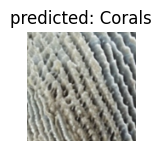

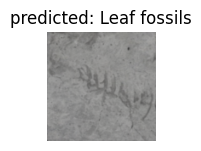

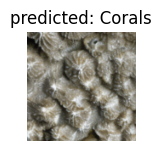

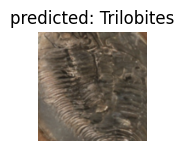

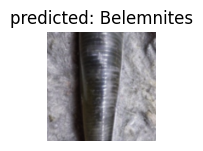

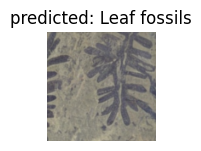

In [ ]:
visualize_model(model_ft)

In [ ]:
# v4 added loss logger
print(len(loss_logger_train))
print(len(loss_logger_val))

310
80


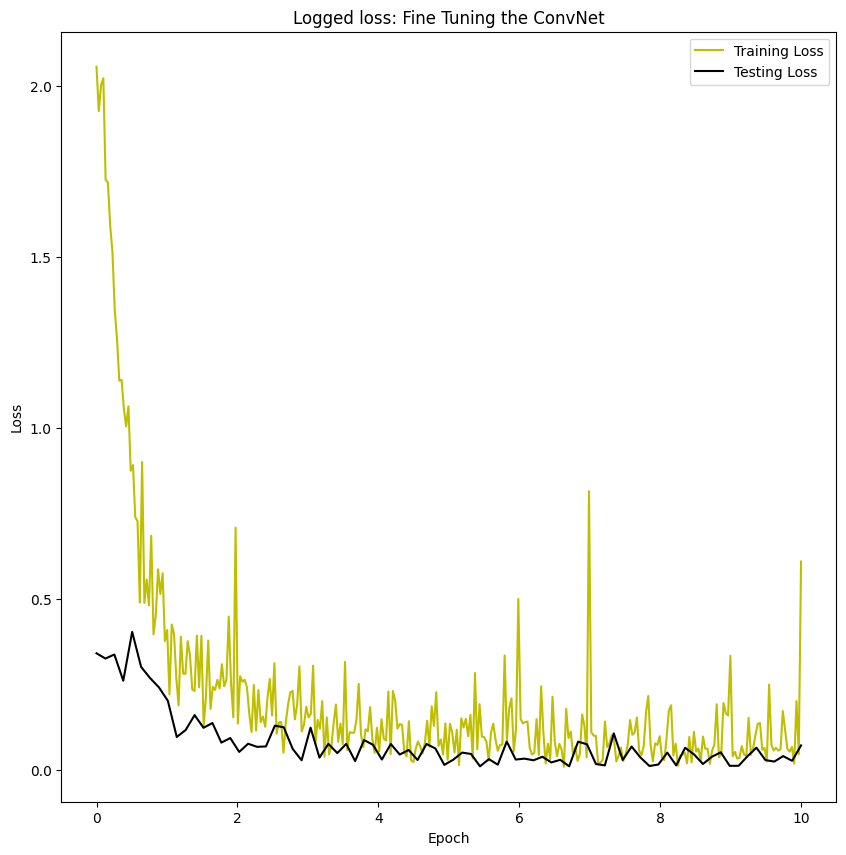

In [ ]:
# v4 loss logger plotting code adapted from code provided by Hisham Jarward in taught module
plt.figure(figsize = (10,10))
train_x = np.linspace(0, num_epochs, len(loss_logger_train))
plt.plot(train_x, loss_logger_train, c = "y")

# added in v5 to plot validation loss
valid_x = np.linspace(0, num_epochs, len(loss_logger_val))
plt.plot(valid_x, loss_logger_val, c = "k")

plt.title("Logged loss: Fine Tuning the ConvNet")
plt.legend(["Training Loss", "Testing Loss"])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

ConvNet as fixed feature extractor
==================================

Here, we need to freeze all the network except the final layer. We need
to set `requires_grad = False` to freeze the parameters so that the
gradients are not computed in `backward()`.

You can read more about this in the documentation
[here](https://pytorch.org/docs/notes/autograd.html#excluding-subgraphs-from-backward).


In [ ]:
model_conv = torchvision.models.resnet18(weights='IMAGENET1K_V1')

# turn off training of gradients for parameters to use pretrained weights
for param in model_conv.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = model_conv.fc.in_features
model_conv.fc = nn.Linear(num_ftrs, len(class_names))

model_conv = model_conv.to(device)

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(model_conv.fc.parameters(), lr=lrate, momentum=0.9)
#optimizer_conv = optim.Adam(model_conv.fc.parameters(), lr=lrate)

# Decay LR by a factor of 0.1 every 7 epochs
exp_lr_scheduler = lr_scheduler.StepLR(optimizer_conv, step_size=7, gamma=0.1)

In [ ]:
# print feature extractor model structure (order of layer definition)
print(model_conv)

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

Train and evaluate
==================

On CPU this will take about half the time compared to previous scenario.
This is expected as gradients don\'t need to be computed for most of the
network. However, forward does need to be computed.


In [ ]:
loss_logger_train=[]
loss_logger_val=[]
model_conv = train_model(model_conv, criterion, optimizer_conv,
                         exp_lr_scheduler, num_epochs)

Epoch 1/10
----------
train Loss: 1.3462 Acc: 0.5242
val Loss: 0.7035 Acc: 0.8708

Epoch 2/10
----------
train Loss: 0.5962 Acc: 0.8469
val Loss: 0.4182 Acc: 0.9458

Epoch 3/10
----------
train Loss: 0.4409 Acc: 0.8900
val Loss: 0.3212 Acc: 0.9542

Epoch 4/10
----------
train Loss: 0.3364 Acc: 0.9239
val Loss: 0.2791 Acc: 0.9625

Epoch 5/10
----------
train Loss: 0.3239 Acc: 0.9250
val Loss: 0.2528 Acc: 0.9583

Epoch 6/10
----------
train Loss: 0.2806 Acc: 0.9342
val Loss: 0.2407 Acc: 0.9583

Epoch 7/10
----------
train Loss: 0.2673 Acc: 0.9363
val Loss: 0.2256 Acc: 0.9542

Epoch 8/10
----------
train Loss: 0.2405 Acc: 0.9455
val Loss: 0.2207 Acc: 0.9625

Epoch 9/10
----------
train Loss: 0.2467 Acc: 0.9404
val Loss: 0.2144 Acc: 0.9667

Epoch 10/10
----------
train Loss: 0.2572 Acc: 0.9424
val Loss: 0.2240 Acc: 0.9583

Training complete in 2m 40s
Best val Acc: 0.966667


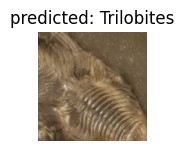

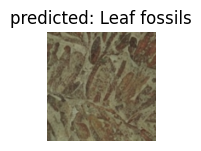

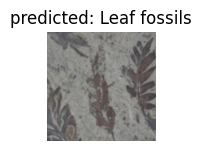

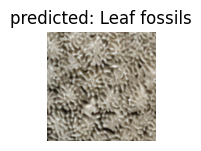

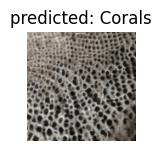

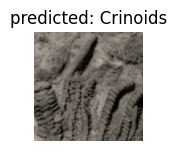

In [ ]:
visualize_model(model_conv)

plt.ioff()
plt.show()

In [ ]:
# v4 added loss logger
print(len(loss_logger_train))
print(len(loss_logger_val))

310
80


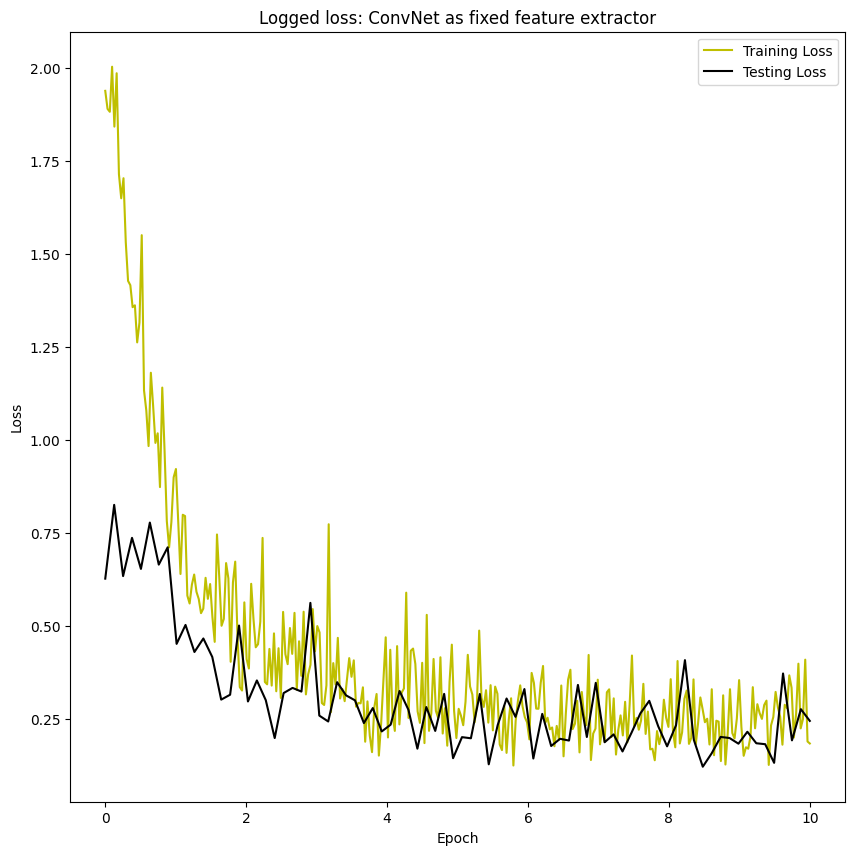

In [ ]:
# v4 loss logger plotting code adapted from code provided by Hisham Jarward in taught module
plt.figure(figsize = (10,10))
train_x = np.linspace(0, num_epochs, len(loss_logger_train))
plt.plot(train_x, loss_logger_train, c = "y")

# added in v5 to plot validation loss
valid_x = np.linspace(0, num_epochs, len(loss_logger_val))
plt.plot(valid_x, loss_logger_val, c = "k")

plt.title("Logged loss: ConvNet as fixed feature extractor")
plt.legend(["Training Loss", "Testing Loss"])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

Inference on custom images
==========================

Use the trained model to make predictions on custom images and visualize
the predicted class labels along with the images.


In [ ]:
def visualize_model_predictions(model,img_path):
    was_training = model.training
    model.eval()

    img = Image.open(img_path)
    img = data_transforms['val'](img)
    img = img.unsqueeze(0)
    img = img.to(device)

    with torch.no_grad():
        outputs = model(img)
        _, preds = torch.max(outputs, 1)

        ax = plt.subplot(2,2,1)
        ax.axis('off')
        ax.set_title(f'Predicted: {class_names[preds[0]]}')
        imshow(img.cpu().data[0])

        model.train(mode=was_training)

In [ ]:
# create list of real fossil images to test
image_list = ['Ammonites Oxford/P854305.1000x1000.jpg', 'Ammonites Oxford/OUMNH_PAL_J012916_01.1000x1000.jpg',
              'Ammonites Oxford/P851610.1000x1000.jpg', 'Ammonites Oxford/P851621.1000x1000.jpg',
              'Belemnites Oxford/P851689.1000x1000.jpg', 'Belemnites Oxford/PAL-Q.12943_001.1000x1000.jpg',
              'Belemnites Oxford/PAL-Q.12951_001.1000x1000.jpg', 'Belemnites Oxford/PAL-Q.15252_001.1000x1000.jpg',
              'Coral Oxford/PAL-Q.12899_001.1000x1000.jpg', 'Coral Oxford/PAL_CL03816_01.1000x1000.jpg',
              'Coral Oxford/PAL-Q.12901_001.1000x1000.jpg', 'Coral Oxford/PAL_CL02648_01.1000x1000.jpg',
              'Crinoid Oxford/J041307_07-2021.1000x1000.jpg', 'Crinoid Oxford/PAL-GZ00070_01.1000x1000.jpg',
              'Crinoid Oxford/P850327.1000x1000.jpg', 'Crinoid Oxford/P851416.1000x1000.jpg',
              'Leaf Oxford/P852440.1000x1000.jpg', 'Leaf Oxford/P852348.1000x1000.jpg',
              'Leaf Oxford/OUMNH_PAL_NZ00292_01.1000x1000.jpg', 'Leaf Oxford/OUMNH_PAL_NZ00290_01.1000x1000.jpg',
              'Trilobites Oxford/BX00008_01.1000x1000.jpg', 'Trilobites Oxford/OUMNH_PAL_AT00087_01.1000x1000.jpg',
              'Trilobites Oxford/PAL-AT00205_02.JPG', 'Trilobites Oxford/OUMNH_PAL_C17775_01.1000x1000.jpg'
              ]


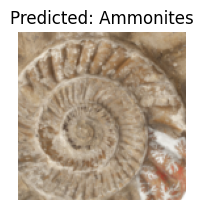

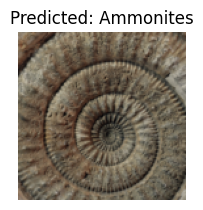

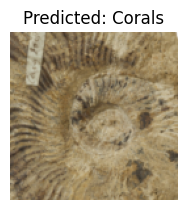

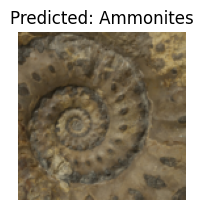

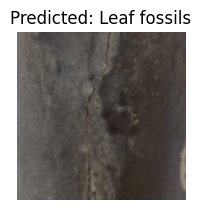

...

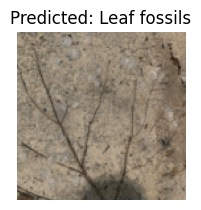

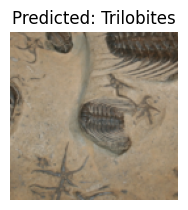

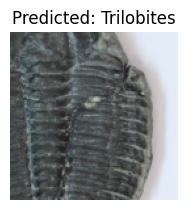

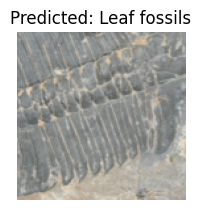

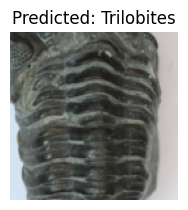

In [ ]:
# Using ConvNet as feature extractor for prediction

for image in image_list:
  visualize_model_predictions(
    model_conv,
    img_path=f'/content/drive/My Drive/Oxford Images copy/{image}'
)

plt.ioff()
plt.show()

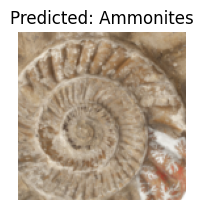

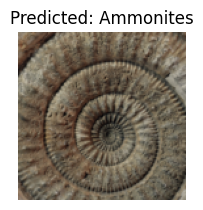

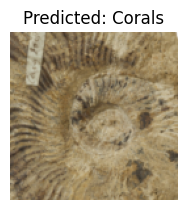

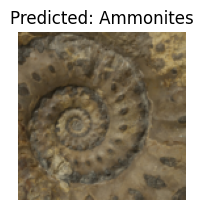

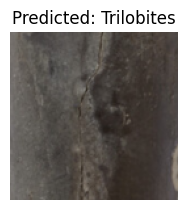

...

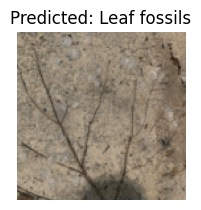

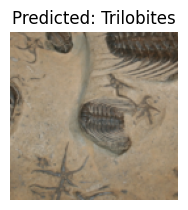

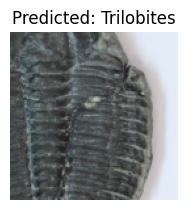

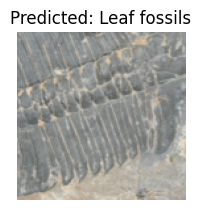

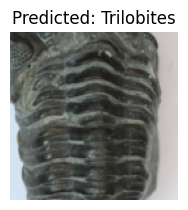

In [ ]:
# Using fine tuned ConvNet for prediction

for image in image_list:
  visualize_model_predictions(
    model_ft,
    img_path=f'/content/drive/My Drive/Oxford Images copy/{image}'
)

plt.ioff()
plt.show()